In [ ]:
import pandas as pd
df = pd.read_csv('data.csv')

In [2]:
df['YearsCodePro'] = df['YearsCodePro'].str.extract(r'(\d+)') 
df['YearsCodePro'] = pd.to_numeric(df['YearsCodePro'], errors='coerce')  
max(df['YearsCodePro'])

50.0

In [3]:
data = df

In [4]:
# Shuffle các hàng trong DataFrame
data = data.sample(frac=1, random_state=42).reset_index(drop=True)


# Phân tích và xác định hướng làm

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [6]:
country_counts = data['Country'].value_counts()
rare_countries = country_counts[country_counts < 10].index
data['Country'] = data['Country'].replace(rare_countries, 'Other')


In [7]:
def clean_devtype(value):
    if pd.isnull(value):
        return ["Unknown"]
    return [role.strip() for role in str(value).split(",")]

if 'DevType' in df.columns:
    df['DevType'] = df['DevType'].apply(clean_devtype)

In [8]:
len(df[df['YearsCodePro'].isna()])

20

In [9]:
df = df.dropna(subset=['YearsCodePro'])

In [10]:
df[df['EdLevel'].isna()]

,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith


In [11]:
education_keywords = {
    "Bachelor": ["Bachelor", "Undergraduate", "BSc", "BA", "BEng"],
    "Master": ["Master", "MSc", "MA", "MEng", "MBA"],
    "PhD": ["PhD", "Doctoral", "Doctorate"],
    "Associate": ["Associate", "AAS", "AS"],
    "High School": ["High school", "Secondary school", "Highschool", "HS"],
    "Other": []
}

def classify_education_level(ed_level):
    if pd.isnull(ed_level):
        return "Other"
    
    levels_found = []
    for level, keywords in education_keywords.items():
        if any(keyword.lower() in str(ed_level).lower() for keyword in keywords):
            levels_found.append(level)
    
    if "Master" in levels_found:
        return "Master"
    elif "PhD" in levels_found:
        return "PhD"
    elif "Bachelor" in levels_found:
        return "Bachelor"
    elif "Associate" in levels_found:
        return "Associate"
    elif "High School" in levels_found:
        return "High School"
    else:
        return "Other"

df['EdLevelGroup'] = df['EdLevel'].apply(classify_education_level)

df


,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup
0,23352.0,35-44 years old,25,12.0,Spain,"Secondary school (e.g. American high school, G...","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['Bash/Shell', 'C', 'C#', 'C++', 'Delphi', 'HT...","['MariaDB', 'Microsoft SQL Server', 'MongoDB',...",['Microsoft Azure'],"['ASP.NET', 'ASP.NET Core ']","['Docker', 'Git', 'Xamarin']",Master
1,64085.0,18-24 years old,7,2.0,Canada,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack]",Employed full-time,"['Bash/Shell', 'Go', 'JavaScript', 'Python']","['PostgreSQL', 'SQLite']",['Microsoft Azure'],"['Django', 'Gatsby']","['Docker', 'Git']",Bachelor
2,75669.0,35-44 years old,20,17.0,Austria,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Data scientist or machi...",Employed full-time,"['JavaScript', 'Python', 'Ruby', 'Rust']","['MongoDB', 'PostgreSQL', 'SQLite']",['Heroku'],['Ruby on Rails'],"['Docker', 'Git', 'Yarn']",Bachelor
3,55904.0,45-54 years old,20,16.0,New Zealand,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Developer, back-end;Dat...",Employed full-time,"['Bash/Shell', 'JavaScript', 'PHP', 'Python', ...","['MariaDB', 'MySQL', 'PostgreSQL', 'SQLite']",[],['Vue.js'],"['Docker', 'Git']",Bachelor
4,146712.0,25-34 years old,11,7.0,"Venezuela, Bolivarian Republic of...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, full-stack;De...","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'Kotlin', 'Node.js'...","['MariaDB', 'MongoDB', 'MySQL', 'PostgreSQL', ...","['AWS', 'Google Cloud Platform']","['Angular', 'Express', 'Laravel', 'React.js', ...",['Git'],Bachelor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,6580.0,25-34 years old,4,3.0,India,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, mobile]","Employed, full-time","['C', 'Dart', 'Go', 'Kotlin', 'PHP', 'Python',...","['MySQL', 'SQLite']","['Firebase', 'Google Cloud', 'OpenStack']","['Django', 'Laravel']",[],Bachelor
3996,23629.0,25-34 years old,11,4.0,Greece,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, back-end]","Employed, full-time","['Elixir', 'Python', 'SQL']","['Elasticsearch', 'PostgreSQL']",[],['Phoenix'],"['Docker', 'Make', 'Pip']",Master
3997,4033.0,45-54 years old,20,17.0,Hungary,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, back-end]","Employed, full-time","['HTML/CSS', 'Java', 'JavaScript', 'SQL']",['PostgreSQL'],[],"['Angular', 'AngularJS']","['Docker', 'Gradle']",Bachelor
3998,75184.0,45-54 years old,8,8.0,Netherlands,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, front-end]","Employed, full-time","['HTML/CSS', 'JavaScript', 'TypeScript']",[],['Microsoft Azure'],['Angular'],"['npm', 'Webpack']",Master


In [12]:
import pandas as pd
import re

devtype_keywords = {
    "Web Developer": ["front-end", "back-end", "full-stack", "web"],
    "Mobile Developer": ["mobile", "embedded"],
    "Data Professional": ["data", "scientist", "engineer", "administrator"],
    "Game Developer": ["game", "graphics"],
    "DevOps/SRE": ["devops", "site reliability", "sre"],
    "Other": ["engineering manager", "educator", "researcher", "unknown"]
}

def classify_devtype_group(roles):
    if not roles or not isinstance(roles, list):  
        return ["Other"]

    roles = [role.lower() for role in roles] 
    dev_groups = []

    for group, keywords in devtype_keywords.items():
        keywords = [keyword.lower() for keyword in keywords] 
        if any(re.search(r'\b' + re.escape(keyword) + r'\b', role) for role in roles for keyword in keywords):
            dev_groups.append(group)

    return dev_groups if dev_groups else ["Other"]

df['DevType'] = df['DevType'].apply(lambda x: x if isinstance(x, list) else [])

df['DevGroup'] = df['DevType'].apply(classify_devtype_group)

df

,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup
0,23352.0,35-44 years old,25,12.0,Spain,"Secondary school (e.g. American high school, G...","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['Bash/Shell', 'C', 'C#', 'C++', 'Delphi', 'HT...","['MariaDB', 'Microsoft SQL Server', 'MongoDB',...",['Microsoft Azure'],"['ASP.NET', 'ASP.NET Core ']","['Docker', 'Git', 'Xamarin']",Master,"[Web Developer, Data Professional]"
1,64085.0,18-24 years old,7,2.0,Canada,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack]",Employed full-time,"['Bash/Shell', 'Go', 'JavaScript', 'Python']","['PostgreSQL', 'SQLite']",['Microsoft Azure'],"['Django', 'Gatsby']","['Docker', 'Git']",Bachelor,[Web Developer]
2,75669.0,35-44 years old,20,17.0,Austria,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Data scientist or machi...",Employed full-time,"['JavaScript', 'Python', 'Ruby', 'Rust']","['MongoDB', 'PostgreSQL', 'SQLite']",['Heroku'],['Ruby on Rails'],"['Docker', 'Git', 'Yarn']",Bachelor,"[Web Developer, Data Professional, DevOps/SRE]"
3,55904.0,45-54 years old,20,16.0,New Zealand,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Developer, back-end;Dat...",Employed full-time,"['Bash/Shell', 'JavaScript', 'PHP', 'Python', ...","['MariaDB', 'MySQL', 'PostgreSQL', 'SQLite']",[],['Vue.js'],"['Docker', 'Git']",Bachelor,"[Web Developer, Data Professional, Other]"
4,146712.0,25-34 years old,11,7.0,"Venezuela, Bolivarian Republic of...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, full-stack;De...","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'Kotlin', 'Node.js'...","['MariaDB', 'MongoDB', 'MySQL', 'PostgreSQL', ...","['AWS', 'Google Cloud Platform']","['Angular', 'Express', 'Laravel', 'React.js', ...",['Git'],Bachelor,[Web Developer]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,6580.0,25-34 years old,4,3.0,India,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, mobile]","Employed, full-time","['C', 'Dart', 'Go', 'Kotlin', 'PHP', 'Python',...","['MySQL', 'SQLite']","['Firebase', 'Google Cloud', 'OpenStack']","['Django', 'Laravel']",[],Bachelor,[Mobile Developer]
3996,23629.0,25-34 years old,11,4.0,Greece,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, back-end]","Employed, full-time","['Elixir', 'Python', 'SQL']","['Elasticsearch', 'PostgreSQL']",[],['Phoenix'],"['Docker', 'Make', 'Pip']",Master,[Web Developer]
3997,4033.0,45-54 years old,20,17.0,Hungary,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, back-end]","Employed, full-time","['HTML/CSS', 'Java', 'JavaScript', 'SQL']",['PostgreSQL'],[],"['Angular', 'AngularJS']","['Docker', 'Gradle']",Bachelor,[Web Developer]
3998,75184.0,45-54 years old,8,8.0,Netherlands,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, front-end]","Employed, full-time","['HTML/CSS', 'JavaScript', 'TypeScript']",[],['Microsoft Azure'],['Angular'],"['npm', 'Webpack']",Master,[Web Developer]


In [13]:
df[df['Country'].isna()]

,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup


In [14]:
df[df['Employment'].isna()]

,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup


In [15]:
df.dtypes

ConvertedCompYearly        float64
Age                         object
YearsCode                   object
YearsCodePro               float64
Country                     object
EdLevel                     object
DevType                     object
Employment                  object
LanguageHaveWorkedWith      object
DatabaseHaveWorkedWith      object
PlatformHaveWorkedWith      object
WebframeHaveWorkedWith      object
ToolsTechHaveWorkedWith     object
EdLevelGroup                object
DevGroup                    object
dtype: object

In [16]:
data = df

In [17]:
data.isnull().sum()

ConvertedCompYearly        0
Age                        8
YearsCode                  4
YearsCodePro               0
Country                    0
EdLevel                    0
DevType                    0
Employment                 0
LanguageHaveWorkedWith     0
DatabaseHaveWorkedWith     0
PlatformHaveWorkedWith     0
WebframeHaveWorkedWith     0
ToolsTechHaveWorkedWith    0
EdLevelGroup               0
DevGroup                   0
dtype: int64

In [18]:
data = data.reset_index(drop = True)

In [19]:
import re

def extract_average_age(age_str):
    if isinstance(age_str, str):
        match = re.match(r'(\d+)-(\d+)', age_str)
        if match:
            lower, upper = map(int, match.groups())
            if (lower + upper)/2 %2==0 :
                return ((lower + upper) / 2)
            else:
                return (lower+upper)/2+0.5
    return None 

data['Age'] = data['Age'].apply(extract_average_age)


In [20]:
import numpy as np

In [21]:
data = data.dropna()

In [22]:
# lower_bound

In [23]:
# Xác định IQR và giới hạn
Q1 = data['YearsCodePro'].quantile(0.25)
Q3 = data['YearsCodePro'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = max(0, Q1 - 1.5 * IQR)
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['YearsCodePro'] < lower_bound) | (data['YearsCodePro'] > upper_bound)]

print('lowerbound:', lower_bound)
print('upperbound:', upper_bound)
outliers

lowerbound: 0
upperbound: 30.5


,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup
20,16679.0,50.0,40,33.0,South Africa,"Secondary school (e.g. American high school, G...","[Developer, full-stack;Other (please specify):]","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'PHP']","['MariaDB', 'MySQL']",[],"['jQuery', 'Ruby on Rails']",['Git'],Master,[Web Developer]
42,24000.0,60.0,43,43.0,"Venezuela, Bolivarian Republic of...",Some college/university study without earning ...,"[Developer, full-stack]","Independent contractor, freelancer, or self-em...","['JavaScript', 'PHP', 'SQL']",['MariaDB'],[],['jQuery'],['Git'],Other,[Web Developer]
46,70186.0,60.0,35,33.0,Canada,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Designer]",Employed full-time,"['C', 'C++', 'HTML/CSS', 'JavaScript', 'Node.j...","['PostgreSQL', 'SQLite']",['DigitalOcean'],['Vue.js'],"['Git', 'Yarn']",Bachelor,[Web Developer]
97,96000.0,60.0,35,32.0,United States of America,Some college/university study without earning ...,"[Developer, mobile;Developer, front-end;Develo...",Employed full-time,"['C', 'C++', 'Java', 'JavaScript', 'Node.js', ...","['PostgreSQL', 'Redis']","['AWS', 'Microsoft Azure']","['jQuery', 'Vue.js']","['Docker', 'Git']",Other,"[Web Developer, Mobile Developer, Data Profess..."
105,120000.0,60.0,42,40.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['C#', 'HTML/CSS', 'JavaScript', 'SQL', 'TypeS...","['Microsoft SQL Server', 'SQLite']",['Microsoft Azure'],"['Angular', 'ASP.NET Core ', 'jQuery', 'Vue.js']",['Git'],Bachelor,"[Web Developer, Data Professional]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3802,132.0,60.0,36,35.0,Australia,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",[System administrator],"Independent contractor, freelancer, or self-em...","['Bash/Shell (all shells)', 'C', 'C++', 'Go', ...","['Firebird', 'PostgreSQL']",['Colocation'],['Htmx'],"['Ansible', 'Docker', 'Make', 'npm']",Other,[Data Professional]
3816,280253.0,60.0,48,43.0,United Kingdom of Great Britain and Northern I...,Some college/university study without earning ...,[Data engineer],"Independent contractor, freelancer, or self-em...","['Python', 'SQL']","['Databricks SQL', 'PostgreSQL']","['Amazon Web Services (AWS)', 'Databricks', 'G...",['Django'],"['Docker', 'Homebrew']",Other,[Data Professional]
3844,195000.0,60.0,42,42.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack]","Employed, full-time","['C#', 'SQL']","['PostgreSQL', 'SQLite']",['Digital Ocean'],"['ASP.NET CORE', 'Blazor']","['Docker', 'Homebrew', 'Kubernetes', 'npm']",Bachelor,[Web Developer]
3905,94517.0,60.0,44,42.0,Netherlands,Some college/university study without earning ...,[Other (please specify):],"Employed, full-time","['Assembly', 'Bash/Shell (all shells)', 'C#', ...","['Microsoft SQL Server', 'MySQL', 'PostgreSQL']",['Microsoft Azure'],"['Angular', 'jQuery']","['Docker', 'Make', 'Maven (build tool)', 'MSBu...",Other,[Other]


In [24]:
data['YearsCode'] = data['YearsCode'].str.extract(r'(\d+)') 
data['YearsCode'] = pd.to_numeric(data['YearsCode'], errors='coerce')  

In [25]:
# Xác định IQR và giới hạn
Q1 = data['YearsCode'].quantile(0.25)
Q3 = data['YearsCode'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = max(0, Q1 - 1.5 * IQR)
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['YearsCode'] < lower_bound) | (data['YearsCode'] > upper_bound)]

print('lowerbound:', lower_bound)
print('upperbound:', upper_bound)
outliers

lowerbound: 0
upperbound: 39.5


,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup
20,16679.0,50.0,40,33.0,South Africa,"Secondary school (e.g. American high school, G...","[Developer, full-stack;Other (please specify):]","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'PHP']","['MariaDB', 'MySQL']",[],"['jQuery', 'Ruby on Rails']",['Git'],Master,[Web Developer]
42,24000.0,60.0,43,43.0,"Venezuela, Bolivarian Republic of...",Some college/university study without earning ...,"[Developer, full-stack]","Independent contractor, freelancer, or self-em...","['JavaScript', 'PHP', 'SQL']",['MariaDB'],[],['jQuery'],['Git'],Other,[Web Developer]
105,120000.0,60.0,42,40.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['C#', 'HTML/CSS', 'JavaScript', 'SQL', 'TypeS...","['Microsoft SQL Server', 'SQLite']",['Microsoft Azure'],"['Angular', 'ASP.NET Core ', 'jQuery', 'Vue.js']",['Git'],Bachelor,"[Web Developer, Data Professional]"
119,97288.0,60.0,40,32.0,Germany,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, full-stack;DevOps specialist]",Employed full-time,"['JavaScript', 'Node.js', 'Perl']","['Elasticsearch', 'MariaDB', 'MySQL', 'Oracle'...","['AWS', 'Microsoft Azure']","['jQuery', 'Vue.js']",['Git'],Master,"[Web Developer, DevOps/SRE]"
140,130000.0,50.0,41,22.0,United States of America,Some college/university study without earning ...,"[Developer, front-end;Developer, desktop or en...","Independent contractor, freelancer, or self-em...","['C#', 'F#', 'Python', 'SQL']","['IBM DB2', 'Microsoft SQL Server', 'Oracle']",['Oracle Cloud Infrastructure'],['ASP.NET Core '],['Git'],Other,"[Web Developer, Data Professional]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3888,130000.0,60.0,42,30.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, back-end]","Employed, full-time","['C', 'C++', 'Go', 'Java', 'PHP', 'Python', 'S...","['MariaDB', 'MySQL']",[],[],"['Ansible', 'Podman', 'Terraform']",Bachelor,[Web Developer]
3890,7.0,50.0,40,20.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",[System administrator],"Employed, part-time","['Apex', 'Bash/Shell (all shells)', 'PowerShel...",['Oracle'],['Oracle Cloud Infrastructure (OCI)'],[],[],Bachelor,[Data Professional]
3905,94517.0,60.0,44,42.0,Netherlands,Some college/university study without earning ...,[Other (please specify):],"Employed, full-time","['Assembly', 'Bash/Shell (all shells)', 'C#', ...","['Microsoft SQL Server', 'MySQL', 'PostgreSQL']",['Microsoft Azure'],"['Angular', 'jQuery']","['Docker', 'Make', 'Maven (build tool)', 'MSBu...",Other,[Other]
3921,80555.0,60.0,40,30.0,France,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)","[Developer, front-end]","Employed, full-time","['C', 'C++', 'Python']",[],[],[],['Docker'],Other,[Web Developer]


In [26]:
education_mapping = {
    'Other': 0,
    'Associate': 1,
    'Bachelor': 2,
    'Master': 3,
    'PhD': 4
}

data['EdLevelGroup'] = data['EdLevelGroup'].map(education_mapping)

In [27]:
data

,ConvertedCompYearly,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup
0,23352.0,40.0,25,12.0,Spain,"Secondary school (e.g. American high school, G...","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['Bash/Shell', 'C', 'C#', 'C++', 'Delphi', 'HT...","['MariaDB', 'Microsoft SQL Server', 'MongoDB',...",['Microsoft Azure'],"['ASP.NET', 'ASP.NET Core ']","['Docker', 'Git', 'Xamarin']",3,"[Web Developer, Data Professional]"
1,64085.0,21.5,7,2.0,Canada,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack]",Employed full-time,"['Bash/Shell', 'Go', 'JavaScript', 'Python']","['PostgreSQL', 'SQLite']",['Microsoft Azure'],"['Django', 'Gatsby']","['Docker', 'Git']",2,[Web Developer]
2,75669.0,40.0,20,17.0,Austria,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Data scientist or machi...",Employed full-time,"['JavaScript', 'Python', 'Ruby', 'Rust']","['MongoDB', 'PostgreSQL', 'SQLite']",['Heroku'],['Ruby on Rails'],"['Docker', 'Git', 'Yarn']",2,"[Web Developer, Data Professional, DevOps/SRE]"
3,55904.0,50.0,20,16.0,New Zealand,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Developer, back-end;Dat...",Employed full-time,"['Bash/Shell', 'JavaScript', 'PHP', 'Python', ...","['MariaDB', 'MySQL', 'PostgreSQL', 'SQLite']",[],['Vue.js'],"['Docker', 'Git']",2,"[Web Developer, Data Professional, Other]"
4,146712.0,30.0,11,7.0,"Venezuela, Bolivarian Republic of...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, full-stack;De...","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'Kotlin', 'Node.js'...","['MariaDB', 'MongoDB', 'MySQL', 'PostgreSQL', ...","['AWS', 'Google Cloud Platform']","['Angular', 'Express', 'Laravel', 'React.js', ...",['Git'],2,[Web Developer]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3975,6580.0,30.0,4,3.0,India,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, mobile]","Employed, full-time","['C', 'Dart', 'Go', 'Kotlin', 'PHP', 'Python',...","['MySQL', 'SQLite']","['Firebase', 'Google Cloud', 'OpenStack']","['Django', 'Laravel']",[],2,[Mobile Developer]
3976,23629.0,30.0,11,4.0,Greece,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, back-end]","Employed, full-time","['Elixir', 'Python', 'SQL']","['Elasticsearch', 'PostgreSQL']",[],['Phoenix'],"['Docker', 'Make', 'Pip']",3,[Web Developer]
3977,4033.0,50.0,20,17.0,Hungary,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, back-end]","Employed, full-time","['HTML/CSS', 'Java', 'JavaScript', 'SQL']",['PostgreSQL'],[],"['Angular', 'AngularJS']","['Docker', 'Gradle']",2,[Web Developer]
3978,75184.0,50.0,8,8.0,Netherlands,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, front-end]","Employed, full-time","['HTML/CSS', 'JavaScript', 'TypeScript']",[],['Microsoft Azure'],['Angular'],"['npm', 'Webpack']",3,[Web Developer]


In [28]:

data = data.rename(columns={'ConvertedCompYearly': 'Salary'})
Q1 = data['Salary'].quantile(0.25)
Q3 = data['Salary'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
if lower_bound < 12000:
    lower_bound = 12000

In [29]:
data = data[(data['Salary'] >= lower_bound) & (data['Salary'] <= upper_bound)]


In [30]:
# Combine developer group values into a single string
data['DevGroup'] = data['DevGroup'].apply(lambda x: ', '.join(x))

# Identify outliers based on the salary column
outliers_mask = (data['Salary'] < lower_bound) | (data['Salary'] > upper_bound)

# Remove outliers by filtering out the rows with outlier salaries
data = data[~outliers_mask]



In [31]:

invalid_experience = (data['YearsCode'] > data['Age'] - 15) | \
                     (data['YearsCode'] < 0) | \
                     (data['YearsCode'] > 50)|\
                    (data['YearsCodePro'] > data['YearsCode'])

print(f"Số hàng bất hợp lý trong YearsCodePro: {invalid_experience.sum()}")
data = data[~invalid_experience]

Số hàng bất hợp lý trong YearsCodePro: 669


Đã thử dùng median, lr cho dự đoán YearsCodePro nhưng kết quả đều tệ hơn là bỏ trực tiếp

In [32]:
# Combine all relevant columns into a single 'skills' column
skills_columns = [
    "LanguageHaveWorkedWith",
    "DatabaseHaveWorkedWith",
    "PlatformHaveWorkedWith",
    "ToolsTechHaveWorkedWith",
    "WebframeHaveWorkedWith",
]

# Remove 'NaN' and combine lists while deduplicating
def combine_skills(row):
    combined = []
    for col in skills_columns:
        if pd.notna(row[col]):  # Check if the column is not NaN
            combined.extend(eval(row[col]))  # Convert string representation of lists to actual lists
    return list(set(combined))  # Remove duplicates

data["skills"] = data.apply(combine_skills, axis=1)

data


,Salary,Age,YearsCode,YearsCodePro,Country,EdLevel,DevType,Employment,LanguageHaveWorkedWith,DatabaseHaveWorkedWith,PlatformHaveWorkedWith,WebframeHaveWorkedWith,ToolsTechHaveWorkedWith,EdLevelGroup,DevGroup,skills
0,23352.0,40.0,25,12.0,Spain,"Secondary school (e.g. American high school, G...","[Developer, front-end;Developer, desktop or en...",Employed full-time,"['Bash/Shell', 'C', 'C#', 'C++', 'Delphi', 'HT...","['MariaDB', 'Microsoft SQL Server', 'MongoDB',...",['Microsoft Azure'],"['ASP.NET', 'ASP.NET Core ']","['Docker', 'Git', 'Xamarin']",3,"Web Developer, Data Professional","[C++, Docker, SQL, Git, MariaDB, HTML/CSS, Bas..."
2,75669.0,40.0,20,17.0,Austria,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Data scientist or machi...",Employed full-time,"['JavaScript', 'Python', 'Ruby', 'Rust']","['MongoDB', 'PostgreSQL', 'SQLite']",['Heroku'],['Ruby on Rails'],"['Docker', 'Git', 'Yarn']",2,"Web Developer, Data Professional, DevOps/SRE","[PostgreSQL, Docker, Ruby on Rails, Ruby, Pyth..."
3,55904.0,50.0,20,16.0,New Zealand,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack;Developer, back-end;Dat...",Employed full-time,"['Bash/Shell', 'JavaScript', 'PHP', 'Python', ...","['MariaDB', 'MySQL', 'PostgreSQL', 'SQLite']",[],['Vue.js'],"['Docker', 'Git']",2,"Web Developer, Data Professional, Other","[PHP, TypeScript, MySQL, Vue.js, Docker, Bash/..."
4,146712.0,30.0,11,7.0,"Venezuela, Bolivarian Republic of...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, front-end;Developer, full-stack;De...","Independent contractor, freelancer, or self-em...","['HTML/CSS', 'JavaScript', 'Kotlin', 'Node.js'...","['MariaDB', 'MongoDB', 'MySQL', 'PostgreSQL', ...","['AWS', 'Google Cloud Platform']","['Angular', 'Express', 'Laravel', 'React.js', ...",['Git'],2,Web Developer,"[TypeScript, SQL, Git, Kotlin, MariaDB, Vue.js..."
5,13704.0,40.0,3,2.0,Ukraine,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, back-end]",Employed full-time,"['Node.js', 'SQL', 'TypeScript']","['MongoDB', 'MySQL', 'PostgreSQL']",['AWS'],['Express'],"['Docker', 'Git', 'Yarn']",3,Web Developer,"[TypeScript, MySQL, Node.js, PostgreSQL, Expre..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3973,120000.0,30.0,5,3.0,United States of America,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, back-end]","Employed, full-time","['Bash/Shell (all shells)', 'Go', 'JavaScript'...",['PostgreSQL'],['Amazon Web Services (AWS)'],['React'],['APT'],2,Web Developer,"[APT, Bash/Shell (all shells), Go, SQL, React,..."
3974,41469.0,30.0,13,8.0,Ukraine,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","[Developer, full-stack]","Employed, full-time","['HTML/CSS', 'JavaScript', 'Ruby', 'SQL', 'Typ...","['PostgreSQL', 'Redis']",['Digital Ocean'],"['Angular', 'React', 'Ruby on Rails']",[],2,Web Developer,"[TypeScript, Angular, HTML/CSS, Ruby on Rails,..."
3976,23629.0,30.0,11,4.0,Greece,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, back-end]","Employed, full-time","['Elixir', 'Python', 'SQL']","['Elasticsearch', 'PostgreSQL']",[],['Phoenix'],"['Docker', 'Make', 'Pip']",3,Web Developer,"[Make, Phoenix, Docker, Pip, SQL, Python, Post..."
3978,75184.0,50.0,8,8.0,Netherlands,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","[Developer, front-end]","Employed, full-time","['HTML/CSS', 'JavaScript', 'TypeScript']",[],['Microsoft Azure'],['Angular'],"['npm', 'Webpack']",3,Web Developer,"[TypeScript, Angular, HTML/CSS, npm, Microsoft..."


In [33]:
data = data.drop(columns=[ 'EdLevel', 'DevType', 'Employment', 'LanguageHaveWorkedWith'], axis=1)


In [34]:
data = data.drop(columns=['DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith', 'WebframeHaveWorkedWith', 'ToolsTechHaveWorkedWith'], axis=1)


In [35]:
# data = data.dropna(

In [36]:
data=  data.reset_index(drop=True)

In [37]:
import ast
from sklearn.preprocessing import MultiLabelBinarizer
data['skills'] = data['skills'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

mlb = MultiLabelBinarizer()
skills_encoded_train = mlb.fit_transform(data['skills'])
skills_df_train = pd.DataFrame(skills_encoded_train, columns=mlb.classes_)


In [38]:
data = pd.concat([data.drop(columns=['skills']), skills_df_train], axis=1)

In [39]:
data

,Salary,Age,YearsCode,YearsCodePro,Country,EdLevelGroup,DevGroup,APL,APT,ASP.NET,...,Xamarin,Yarn,Yii 2,Zig,bandit,cppunit,doctest,jQuery,npm,pnpm
0,23352.0,40.0,25,12.0,Spain,3,"Web Developer, Data Professional",0,0,1,...,1,0,0,0,0,0,0,0,0,0
1,75669.0,40.0,20,17.0,Austria,2,"Web Developer, Data Professional, DevOps/SRE",0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,55904.0,50.0,20,16.0,New Zealand,2,"Web Developer, Data Professional, Other",0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,146712.0,30.0,11,7.0,"Venezuela, Bolivarian Republic of...",2,Web Developer,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,13704.0,40.0,3,2.0,Ukraine,3,Web Developer,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2659,120000.0,30.0,5,3.0,United States of America,2,Web Developer,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2660,41469.0,30.0,13,8.0,Ukraine,2,Web Developer,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2661,23629.0,30.0,11,4.0,Greece,3,Web Developer,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2662,75184.0,50.0,8,8.0,Netherlands,3,Web Developer,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [40]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

data_encoded = encoder.fit_transform(data[['Country']])

data_encoded_df = pd.DataFrame(data_encoded, columns=encoder.get_feature_names_out(['Country']))

data = pd.concat([data, data_encoded_df], axis=1)

# train_data = train_data.drop(columns=['Country'])
# val_data = val_data.drop(columns=['Country'])



/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [41]:

def normalize_devgroup(value):
    if isinstance(value, str):  
        return value.split(', ')
    elif isinstance(value, list):  
        return value
    else:  
        return []

data['DevGroup'] = data['DevGroup'].apply(normalize_devgroup)


In [42]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()
devgroup_encoded_combined = mlb.fit_transform(data['DevGroup'])

devgroup_encoded_combined_df = pd.DataFrame(devgroup_encoded_combined, columns=mlb.classes_)


In [43]:
data = pd.concat([ data, devgroup_encoded_combined_df], axis=1)


In [44]:
data = data.drop('DevGroup',axis=1)

In [45]:
data = data.drop('Country',axis=1)

In [46]:
data

,Salary,Age,YearsCode,YearsCodePro,EdLevelGroup,APL,APT,ASP.NET,ASP.NET CORE,ASP.NET Core,...,Country_Uzbekistan,"Country_Venezuela, Bolivarian Republic of...",Country_Viet Nam,Country_Zimbabwe,Data Professional,DevOps/SRE,Game Developer,Mobile Developer,Other,Web Developer
0,23352.0,40.0,25,12.0,3,0,0,1,0,1,...,0.0,0.0,0.0,0.0,1,0,0,0,0,1
1,75669.0,40.0,20,17.0,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1,1,0,0,0,1
2,55904.0,50.0,20,16.0,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1,0,0,0,1,1
3,146712.0,30.0,11,7.0,2,0,0,0,0,0,...,0.0,1.0,0.0,0.0,0,0,0,0,0,1
4,13704.0,40.0,3,2.0,3,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2659,120000.0,30.0,5,3.0,2,0,1,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2660,41469.0,30.0,13,8.0,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2661,23629.0,30.0,11,4.0,3,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2662,75184.0,50.0,8,8.0,3,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1


Chia thành tập train, kiểm thử và val rồi xử lý các giá trị ngoại lai bằng trung vị...

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


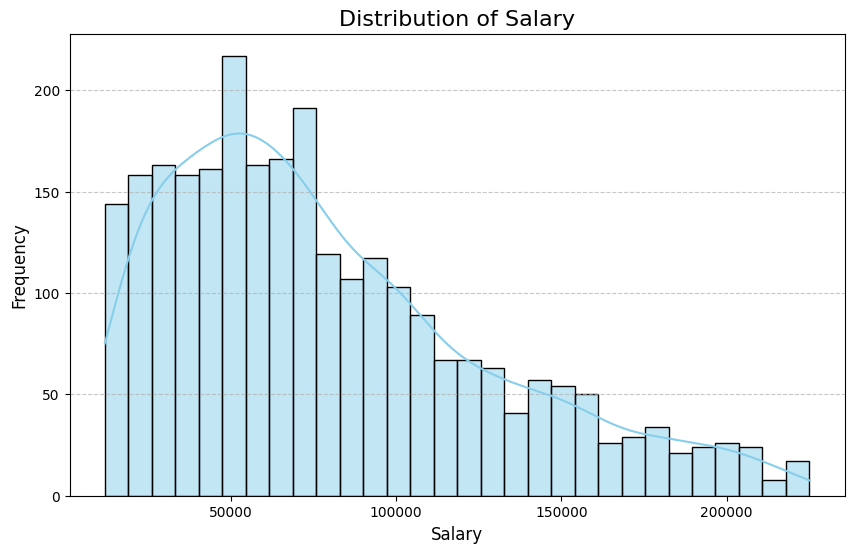

In [47]:
plt.figure(figsize=(10, 6))
sns.histplot(data['Salary'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Salary', fontsize=16)
plt.xlabel('Salary', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

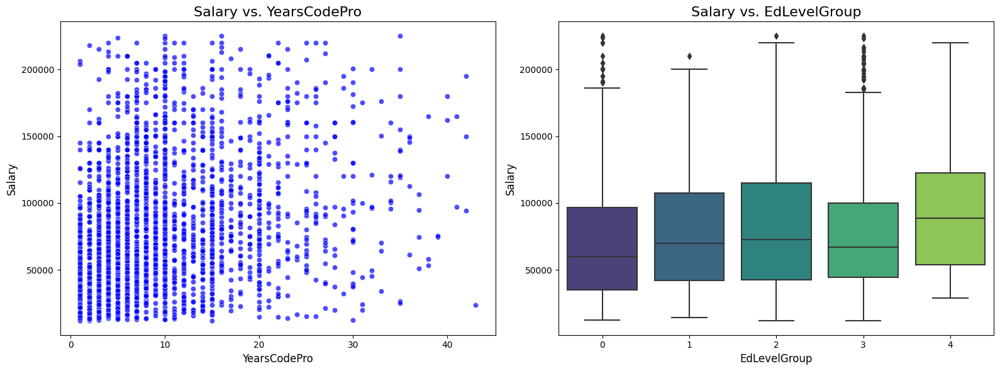

In [48]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.scatterplot(x=data['YearsCodePro'], y=data['Salary'], ax=axes[0], color='blue', alpha=0.7)
axes[0].set_title('Salary vs. YearsCodePro', fontsize=16)
axes[0].set_xlabel('YearsCodePro', fontsize=12)
axes[0].set_ylabel('Salary', fontsize=12)
sns.boxplot(x=data['EdLevelGroup'], y=data['Salary'], ax=axes[1], palette='viridis')
axes[1].set_title('Salary vs. EdLevelGroup', fontsize=16)
axes[1].set_xlabel('EdLevelGroup', fontsize=12)
axes[1].set_ylabel('Salary', fontsize=12)

plt.tight_layout()
plt.show()


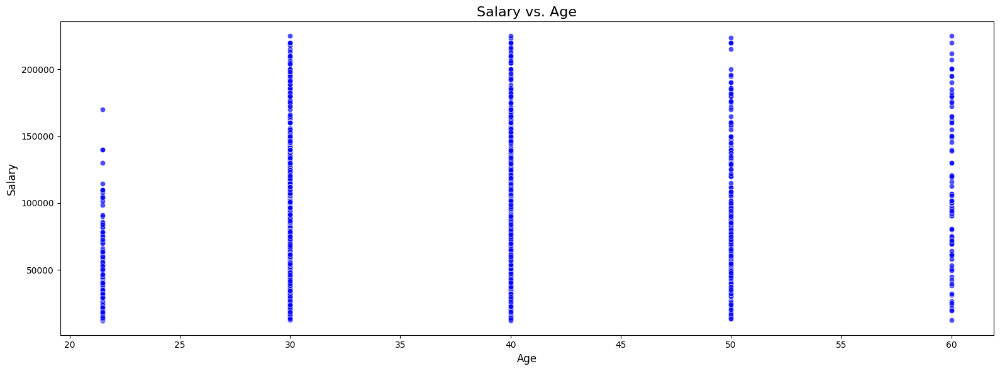

In [49]:
fig, axes = plt.subplots(1, 1, figsize=(16, 6))
sns.scatterplot(x=data['Age'], y=data['Salary'], color='blue', alpha=0.7)
axes.set_title('Salary vs. Age', fontsize=16)
axes.set_xlabel('Age', fontsize=12)
axes.set_ylabel('Salary', fontsize=12)
plt.tight_layout()
plt.show()


In [50]:
# from sklearn.ensemble import RandomForestRegressor
# rf_model = RandomForestRegressor(random_state=42)
# rf_model.fit(data.drop('Salary', axis=1), data['Salary'])

# feature_importances = pd.Series(rf_model.feature_importances_, index=df_dropped.drop('Salary', axis=1).columns)

# feature_importances_sorted = feature_importances.sort_values(ascending=False)

# plt.figure(figsize=(10, 6))
# feature_importances_sorted[:10].plot(kind='barh', color='orange')  # Hiển thị top 10
# plt.title("Top Features by Importance from RandomForest")
# plt.xlabel("Feature Importance")
# plt.ylabel("Features")
# plt.show()


In [51]:
# correlations = data.corr()['Salary'].abs()
# sorted_correlations = correlations.sort_values()
# num_cols_to_drop = int(0.8* len(data.columns))
# cols_to_drop = sorted_correlations.iloc[:num_cols_to_drop].index
# df_dropped = data.drop(cols_to_drop,axis=1)

In [52]:
# import matplotlib.pyplot as plt

# # Lấy tương quan của các đặc trưng quan trọng
# important_correlations = sorted_correlations[-(len(data.columns) - num_cols_to_drop):]

# # Vẽ biểu đồ
# plt.figure(figsize=(12, 10))
# important_correlations.plot(kind='barh', color='skyblue')
# plt.title("Top 20% Features by Correlation with Salary")
# plt.xlabel("Absolute Correlation")
# plt.ylabel("Features")
# plt.show()


In [53]:
from sklearn.model_selection import StratifiedShuffleSplit

X = data.drop(columns=['EdLevelGroup'])  
y = data['EdLevelGroup'] 

splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_idx, temp_idx in splitter.split(X, y):
    train_data = data.iloc[train_idx]
    temp_data = data.iloc[temp_idx]

splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
for val_idx, real_idx in splitter.split(temp_data.drop(columns=['EdLevelGroup']), temp_data['EdLevelGroup']):
    val_data = temp_data.iloc[val_idx]
    real_data = temp_data.iloc[real_idx]

print(f"Kích thước train: {len(train_data)}")
print(f"Kích thước val: {len(val_data)}")
print(f"Kích thước realval: {len(real_data)}")


Kích thước train: 2131
Kích thước val: 266
Kích thước realval: 267


In [54]:
train_data = train_data.reset_index(drop=True)
val_data = val_data.reset_index(drop=True)

In [55]:
# Q1 = train_data['YearsCode'].quantile(0.25)
# Q3 = train_data['YearsCode'].quantile(0.75)
# IQR = Q3 - Q1
# lower_bound = Q1 - 1.5 * IQR
# upper_bound = Q3 + 1.5 * IQR

In [56]:

# valid_data = train_data[(train_data['YearsCode'] >= lower_bound)& (train_data['YearsCode'] <= upper_bound)]

# median_years_by_edlevel = valid_data.groupby('EdLevelGroup')['YearsCode'].median()

# median_years_by_edlevel = median_years_by_edlevel.fillna(0)

# def replace_outlier(row):
#     if row['YearsCode'] < lower_bound or row['YearsCode'] > upper_bound:
#         return median_years_by_edlevel.get(row['EdLevelGroup'], 0)
#     return row['YearsCode']

# train_data['YearsCode'] = train_data.apply(replace_outlier, axis=1)

In [57]:
train_data['YearsCode']

0       11
1       25
2       11
3        6
4       25
        ..
2126    20
2127    23
2128    12
2129    11
2130     9
Name: YearsCode, Length: 2131, dtype: int64

In [58]:
Q1 = val_data['YearsCode'].quantile(0.25)
Q3 = val_data['YearsCode'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [59]:

# valid_data = val_data[(val_data['YearsCode'] >= lower_bound) & (val_data['YearsCode'] <= upper_bound)]

# median_years_by_edlevel = valid_data.groupby('EdLevelGroup')['YearsCode'].median()

# median_years_by_edlevel = median_years_by_edlevel.fillna(0)

# def replace_outlier(row):
#     if row['YearsCode'] < lower_bound or row['YearsCode'] > upper_bound:
#         return median_years_by_edlevel.get(row['EdLevelGroup'], 0)
#     return row['YearsCode']

# val_data['YearsCode'] = val_data.apply(replace_outlier, axis=1)

In [60]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

train_data[['YearsCodePro']] = scaler.fit_transform(train_data[['YearsCodePro']])
val_data[['YearsCodePro']] = scaler.transform(val_data[['YearsCodePro']])

train_data[['YearsCode']] = scaler.fit_transform(train_data[['YearsCode']])
val_data[['YearsCode']] = scaler.transform(val_data[['YearsCode']])

In [61]:
data.isnull().sum()

Salary              0
Age                 0
YearsCode           0
YearsCodePro        0
EdLevelGroup        0
                   ..
DevOps/SRE          0
Game Developer      0
Mobile Developer    0
Other               0
Web Developer       0
Length: 332, dtype: int64

In [62]:
X_train = train_data.drop('YearsCodePro',axis=1)
X_train = train_data.drop('YearsCode',axis=1)

In [63]:
X_val = val_data.drop('YearsCodePro',axis=1)
X_val = val_data.drop('YearsCode',axis=1)

In [64]:
X_val = val_data.drop('Salary',axis=1)
y_val = val_data['Salary']

In [65]:
X_train = train_data.drop('Salary',axis=1)
y_train = train_data['Salary']

In [66]:
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

In [67]:
X_train

,Age,YearsCode,YearsCodePro,EdLevelGroup,APL,APT,ASP.NET,ASP.NET CORE,ASP.NET Core,AWS,...,Country_Uzbekistan,"Country_Venezuela, Bolivarian Republic of...",Country_Viet Nam,Country_Zimbabwe,Data Professional,DevOps/SRE,Game Developer,Mobile Developer,Other,Web Developer
0,30.0,-0.327463,-0.453845,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
1,50.0,1.336284,1.402988,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2,30.0,-0.327463,-0.586476,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
3,30.0,-0.921658,-0.719107,3,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
4,40.0,1.336284,1.402988,2,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2126,40.0,0.742089,-0.188584,2,0,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2127,50.0,1.098606,1.270357,3,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,0
2128,30.0,-0.208624,-0.188584,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,1,0,0
2129,30.0,-0.327463,-1.117000,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1


In [68]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score



# Random forest

In [69]:
train_data.to_csv('train.csv',index=False)

In [70]:
rf_model = RandomForestRegressor(n_estimators=1000, max_depth=15,random_state=42)

rf_model.fit(X_train, y_train)


y_pred = rf_model.predict(X_val)

print("MAE:", mean_absolute_error(y_val, y_pred))
print("RMSE:", mean_squared_error(y_val, y_pred, squared=False))
print("R²:", r2_score(y_val, y_pred))


MAE: 22306.172928948472
RMSE: 29258.990677908558
R²: 0.631691778348912


In [71]:
# rf_model = RandomForestRegressor(n_estimators=1000, max_depth=15,random_state=42)

# rf_model.fit(X_train_resampled, y_train_resampled)


# y_pred = rf_model.predict(X_val)

# print("MAE:", mean_absolute_error(y_val, y_pred))
# print("RMSE:", mean_squared_error(y_val, y_pred, squared=False))
# print("R²:", r2_score(y_val, y_pred))


In [72]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# import numpy as np

# rf_model = RandomForestRegressor(random_state=42)

# param_grid = {
#     'n_estimators': [100, 300, 500],
#     'max_depth': [5, 10, 15],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# grid_search = GridSearchCV(
#     estimator=rf_model,
#     param_grid=param_grid,
#     cv=5,
#     scoring='neg_mean_squared_error',
#     n_jobs=-1,
#     verbose=2
# )
# grid_search.fit(X_train, y_train)

# print("Best Parameters:", grid_search.best_params_)

# best_rf_model = grid_search.best_estimator_
# y_pred = best_rf_model.predict(X_val)

# mae = mean_absolute_error(y_val, y_pred)
# rmse = mean_squared_error(y_val, y_pred, squared=False)
# r2 = r2_score(y_val, y_pred)

# print(f"MAE: {mae}")
# print(f"RMSE: {rmse}")
# print(f"R²: {r2}")


In [73]:
from sklearn.ensemble import GradientBoostingRegressor
gb_model = GradientBoostingRegressor(n_estimators=900, learning_rate=0.05, max_depth=3, random_state=42)
gb_model.fit(X_train, y_train)

y_pred = gb_model.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 21570.794481121826
RMSE: 28764.75211152327
R²: 0.6440295038353522


In [74]:
svr = SVR(kernel = "rbf", C =1000000,epsilon = 0.05)
svr.fit(X_train, y_train)

y_pred = svr.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 22386.908577378024
RMSE: 29745.129257173994
R²: 0.6193512101339176


In [75]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

svr = SVR(kernel="rbf")

param_grid = {
    'C': [1, 10, 100, 1000, 10000, 1000000],
    'epsilon': [0.01, 0.05, 0.1, 0.5, 1],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1]
}

grid_search = GridSearchCV(
    estimator=svr,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

y_pred = best_model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Best Parameters: {'C': 1000000, 'epsilon': 0.01, 'gamma': 'scale'}
MAE: 22386.90541508925
RMSE: 29745.125115464376
R²: 0.6193513161369293


# Linear Regression

In [76]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 24976.917763157893
RMSE: 32465.71873557289
R²: 0.546536040125129


# Linear Regression + Bagging

In [77]:
from sklearn.ensemble import BaggingRegressor
lr = LinearRegression()
bagging_regressor = BaggingRegressor(base_estimator=lr, n_estimators=200, random_state=42)

bagging_regressor.fit(X_train, y_train)
y_pred = bagging_regressor.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


MAE: 2492392484690.2686
RMSE: 10967723374069.682
R²: -5.175182969065134e+16


# LGBMRegressor

In [78]:
import lightgbm as lgb
X_train_temp = X_train
X_val_temp = X_val
X_train_temp.columns = X_train_temp.columns.str.replace(r'[^a-zA-Z0-9_]', '_', regex=True)
X_val_temp.columns = X_val_temp.columns.str.replace(r'[^a-zA-Z0-9_]', '_', regex=True)

lgb_model = lgb.LGBMRegressor(n_estimators=900,learning_rate=0.05,max_depth=3,random_state=42)

lgb_model.fit(X_train_temp, y_train)

y_pred_lgb = lgb_model.predict(X_val_temp)

mae_lgb = mean_absolute_error(y_val, y_pred_lgb)
rmse_lgb = mean_squared_error(y_val, y_pred_lgb, squared=False)
r2_lgb = r2_score(y_val, y_pred_lgb)

print(f"MAE: {mae_lgb}")
print(f"RMSE: {rmse_lgb}")
print(f"R²: {r2_lgb}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 433
[LightGBM] [Info] Number of data points in the train set: 2131, number of used features: 173
[LightGBM] [Info] Start training from score 78856.888315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

In [79]:
import optuna
import lightgbm as lgb
from sklearn.model_selection import cross_val_score
import numpy as np

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 500, 800),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'num_leaves': trial.suggest_int('num_leaves', 15, 127),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 30),
        'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)
    }
    model = lgb.LGBMRegressor(**params, random_state=42)
    score = -cross_val_score(model, X_train_temp, y_train, cv=5, scoring='neg_mean_squared_error').mean()
    return np.sqrt(score) 

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print("Best parameters:", study.best_params)
print("Best RMSE:", study.best_value)


[I 2024-12-01 17:07:14,180] A new study created in memory with name: no-name-5deb567c-4eec-4fbe-a7ab-2f58f5b49376
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002563 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 407
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 161
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:15,272] Trial 0 finished with value: 33205.090360213486 and parameters: {'n_estimators': 714, 'learning_rate': 0.045300115601726997, 'max_depth': 3, 'num_leaves': 122, 'min_child_samples': 21, 'subsample': 0.6538114476238086, 'colsample_bytree': 0.7295451195477549}. Best is trial 0 with value: 33205.090360213486.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 408
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 162
[LightGBM] [Info] Start training from score 79210.718475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003268 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 215
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 506
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 212
[LightGBM] [In

[I 2024-12-01 17:07:17,401] Trial 1 finished with value: 32849.696857763716 and parameters: {'n_estimators': 616, 'learning_rate': 0.031524759355425334, 'max_depth': 10, 'num_leaves': 19, 'min_child_samples': 9, 'subsample': 0.9530298232174439, 'colsample_bytree': 0.9920316236756108}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002419 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 383
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 149
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:18,582] Trial 2 finished with value: 34338.301273592515 and parameters: {'n_estimators': 677, 'learning_rate': 0.056259826154155215, 'max_depth': 4, 'num_leaves': 61, 'min_child_samples': 30, 'subsample': 0.8975603107836199, 'colsample_bytree': 0.7694019937431693}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 370
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 143
[LightGBM] [Info] Start training from score 79210.718475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 413
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 164
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-12-01 17:07:19,971] Trial 3 finished with value: 32929.95282463877 and parameters: {'n_estimators': 524, 'learning_rate': 0.024825141568050702, 'max_depth': 6, 'num_leaves': 88, 'min_child_samples': 20, 'subsample': 0.7208224619748804, 'colsample_bytree': 0.722532838293598}. Best is trial 1 with value: 32849.696857763716.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 423
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 169
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:21,220] Trial 4 finished with value: 33196.27895436744 and parameters: {'n_estimators': 640, 'learning_rate': 0.05109000875009006, 'max_depth': 4, 'num_leaves': 63, 'min_child_samples': 18, 'subsample': 0.6109607924681205, 'colsample_bytree': 0.7729092564882408}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 418
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 167
[LightGBM] [Info] Start training from score 79210.718475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002465 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 391
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 153
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:22,851] Trial 5 finished with value: 33421.922337574346 and parameters: {'n_estimators': 700, 'learning_rate': 0.030035441144175935, 'max_depth': 6, 'num_leaves': 17, 'min_child_samples': 26, 'subsample': 0.8070117827014872, 'colsample_bytree': 0.8877947685098937}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:07:25,654] Trial 6 finished with value: 34299.883457431926 and parameters: {'n_estimators': 667, 'learning_rate': 0.10357728434861237, 'max_depth': 8, 'num_leaves': 103, 'min_child_samples': 11, 'subsample': 0.7363390001467217, 'colsample_bytree': 0.690855609841365}. Best is trial 1 with value: 32849.696857763716.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002554 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 401
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 158
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:27,162] Trial 7 finished with value: 35250.07282622187 and parameters: {'n_estimators': 524, 'learning_rate': 0.17283060476875078, 'max_depth': 7, 'num_leaves': 44, 'min_child_samples': 22, 'subsample': 0.8664292401240814, 'colsample_bytree': 0.7539562661811638}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003313 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 247
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:29,452] Trial 8 finished with value: 34113.39022736398 and parameters: {'n_estimators': 566, 'learning_rate': 0.11653030875139452, 'max_depth': 10, 'num_leaves': 27, 'min_child_samples': 5, 'subsample': 0.7554456331456332, 'colsample_bytree': 0.7265802282866557}. Best is trial 1 with value: 32849.696857763716.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 385
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 150
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:30,494] Trial 9 finished with value: 33251.82827209064 and parameters: {'n_estimators': 526, 'learning_rate': 0.01769176382921639, 'max_depth': 4, 'num_leaves': 95, 'min_child_samples': 28, 'subsample': 0.6406177548985287, 'colsample_bytree': 0.7686262173460894}. Best is trial 1 with value: 32849.696857763716.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 148
[LightGBM] [Info] Start training from score 79210.718475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 475
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 195
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:34,392] Trial 10 finished with value: 32851.79027628779 and parameters: {'n_estimators': 785, 'learning_rate': 0.01150870512035576, 'max_depth': 10, 'num_leaves': 39, 'min_child_samples': 12, 'subsample': 0.9928042498755321, 'colsample_bytree': 0.9766430978672186}. Best is trial 1 with value: 32849.696857763716.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 489
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 202
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:38,188] Trial 11 finished with value: 32888.02713652099 and parameters: {'n_estimators': 787, 'learning_rate': 0.011000702849784617, 'max_depth': 10, 'num_leaves': 39, 'min_child_samples': 11, 'subsample': 0.9896782275800524, 'colsample_bytree': 0.9978928270339243}. Best is trial 1 with value: 32849.696857763716.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002817 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 475
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 195
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:41,044] Trial 12 finished with value: 32738.446999685653 and parameters: {'n_estimators': 605, 'learning_rate': 0.012322344086362893, 'max_depth': 9, 'num_leaves': 41, 'min_child_samples': 12, 'subsample': 0.9850875577040042, 'colsample_bytree': 0.9866557892135587}. Best is trial 12 with value: 32738.446999685653.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 247
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 576
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 247
[LightGBM] [Info] Start training from score 78859.136657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003450 seconds.
You

[I 2024-12-01 17:07:42,967] Trial 13 finished with value: 32673.028096500755 and parameters: {'n_estimators': 610, 'learning_rate': 0.020163816662395716, 'max_depth': 8, 'num_leaves': 16, 'min_child_samples': 5, 'subsample': 0.9248948821630376, 'colsample_bytree': 0.9125585724146528}. Best is trial 13 with value: 32673.028096500755.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 565
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 240
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:45,965] Trial 14 finished with value: 32733.507428828125 and parameters: {'n_estimators': 593, 'learning_rate': 0.016997480018645955, 'max_depth': 8, 'num_leaves': 49, 'min_child_samples': 6, 'subsample': 0.9166898427480051, 'colsample_bytree': 0.8954843716834942}. Best is trial 13 with value: 32673.028096500755.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 579
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 247
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:49,337] Trial 15 finished with value: 32955.89836040316 and parameters: {'n_estimators': 579, 'learning_rate': 0.017980012366152587, 'max_depth': 8, 'num_leaves': 77, 'min_child_samples': 5, 'subsample': 0.9003552907572638, 'colsample_bytree': 0.858188311987977}. Best is trial 13 with value: 32673.028096500755.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003142 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 531
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 223
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:51,807] Trial 16 finished with value: 32760.833174640135 and parameters: {'n_estimators': 573, 'learning_rate': 0.019498971297594266, 'max_depth': 7, 'num_leaves': 54, 'min_child_samples': 8, 'subsample': 0.8439388488077169, 'colsample_bytree': 0.895708426267715}. Best is trial 13 with value: 32673.028096500755.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002748 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 435
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 175
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:54,079] Trial 17 finished with value: 32628.905480072888 and parameters: {'n_estimators': 626, 'learning_rate': 0.015262114898214368, 'max_depth': 8, 'num_leaves': 28, 'min_child_samples': 16, 'subsample': 0.9356635966232382, 'colsample_bytree': 0.8280636134116858}. Best is trial 17 with value: 32628.905480072888.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002743 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 451
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 183
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:56,505] Trial 18 finished with value: 33271.93955920061 and parameters: {'n_estimators': 636, 'learning_rate': 0.032383291568854666, 'max_depth': 9, 'num_leaves': 29, 'min_child_samples': 15, 'subsample': 0.9353782967416904, 'colsample_bytree': 0.8303125166631277}. Best is trial 17 with value: 32628.905480072888.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 435
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 175
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:07:58,577] Trial 19 finished with value: 33958.29200303652 and parameters: {'n_estimators': 722, 'learning_rate': 0.06952430066314332, 'max_depth': 6, 'num_leaves': 29, 'min_child_samples': 16, 'subsample': 0.8289717878203698, 'colsample_bytree': 0.9389667779970021}. Best is trial 17 with value: 32628.905480072888.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 401
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 158
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:01,538] Trial 20 finished with value: 33312.206475614745 and parameters: {'n_estimators': 740, 'learning_rate': 0.02435591796336148, 'max_depth': 9, 'num_leaves': 73, 'min_child_samples': 23, 'subsample': 0.8692861282135546, 'colsample_bytree': 0.6520379380751552}. Best is trial 17 with value: 32628.905480072888.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003371 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 230
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:04,614] Trial 21 finished with value: 32807.72927147232 and parameters: {'n_estimators': 600, 'learning_rate': 0.014899149589546318, 'max_depth': 8, 'num_leaves': 51, 'min_child_samples': 7, 'subsample': 0.9284904683910532, 'colsample_bytree': 0.9247393600963589}. Best is trial 17 with value: 32628.905480072888.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 453
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 184
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:06,212] Trial 22 finished with value: 32566.266153810753 and parameters: {'n_estimators': 558, 'learning_rate': 0.01467492170954127, 'max_depth': 7, 'num_leaves': 17, 'min_child_samples': 14, 'subsample': 0.9083691397906785, 'colsample_bytree': 0.8162207269461719}. Best is trial 22 with value: 32566.266153810753.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:07,761] Trial 23 finished with value: 32638.90193260059 and parameters: {'n_estimators': 551, 'learning_rate': 0.010078409435954658, 'max_depth': 7, 'num_leaves': 15, 'min_child_samples': 15, 'subsample': 0.9668612704300541, 'colsample_bytree': 0.8198818382359173}. Best is trial 22 with value: 32566.266153810753.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Total Bins 451
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 183
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

[I 2024-12-01 17:08:09,732] Trial 24 finished with value: 32650.29379450775 and parameters: {'n_estimators': 552, 'learning_rate': 0.010061801447589972, 'max_depth': 7, 'num_leaves': 26, 'min_child_samples': 15, 'subsample': 0.9530737728026724, 'colsample_bytree': 0.8188613150923609}. Best is trial 22 with value: 32566.266153810753.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002611 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 423
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 169
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:11,160] Trial 25 finished with value: 32891.98240774814 and parameters: {'n_estimators': 553, 'learning_rate': 0.013502510404198378, 'max_depth': 5, 'num_leaves': 34, 'min_child_samples': 18, 'subsample': 0.964491432627056, 'colsample_bytree': 0.8413979848583365}. Best is trial 22 with value: 32566.266153810753.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 453
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 184
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-12-01 17:08:12,657] Trial 26 finished with value: 32564.211353546092 and parameters: {'n_estimators': 545, 'learning_rate': 0.014441391107997541, 'max_depth': 7, 'num_leaves': 15, 'min_child_samples': 14, 'subsample': 0.8754917565281349, 'colsample_bytree': 0.8026921876993379}. Best is trial 26 with value: 32564.211353546092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 190
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:13,937] Trial 27 finished with value: 32512.15141928343 and parameters: {'n_estimators': 502, 'learning_rate': 0.024049870720237697, 'max_depth': 5, 'num_leaves': 24, 'min_child_samples': 13, 'subsample': 0.8721518410713569, 'colsample_bytree': 0.7995287354650145}. Best is trial 27 with value: 32512.15141928343.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002746 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 190
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:15,760] Trial 28 finished with value: 32613.73058567923 and parameters: {'n_estimators': 501, 'learning_rate': 0.03726439199023668, 'max_depth': 5, 'num_leaves': 22, 'min_child_samples': 13, 'subsample': 0.7863798600091152, 'colsample_bytree': 0.6125634160446584}. Best is trial 27 with value: 32512.15141928343.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:16,630] Trial 29 finished with value: 32974.344208037764 and parameters: {'n_estimators': 501, 'learning_rate': 0.02495265295146305, 'max_depth': 3, 'num_leaves': 126, 'min_child_samples': 20, 'subsample': 0.881145506038628, 'colsample_bytree': 0.7940764038553336}. Best is trial 27 with value: 32512.15141928343.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 412
[LightGBM] [Info] Number of data points in the train set: 1705, number of used features: 164
[LightGBM] [Info] Start training from score 79210.718475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 215
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:18,067] Trial 30 finished with value: 32895.51749943782 and parameters: {'n_estimators': 536, 'learning_rate': 0.03935031941571587, 'max_depth': 5, 'num_leaves': 36, 'min_child_samples': 9, 'subsample': 0.8331870486094287, 'colsample_bytree': 0.858118106965306}. Best is trial 27 with value: 32512.15141928343.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has b

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 190
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:19,684] Trial 31 finished with value: 32381.001662555656 and parameters: {'n_estimators': 510, 'learning_rate': 0.02235944930605702, 'max_depth': 5, 'num_leaves': 21, 'min_child_samples': 13, 'subsample': 0.7832949155862575, 'colsample_bytree': 0.6245159764156195}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:21,195] Trial 32 finished with value: 32517.93363870265 and parameters: {'n_estimators': 502, 'learning_rate': 0.022190061543281625, 'max_depth': 6, 'num_leaves': 21, 'min_child_samples': 13, 'subsample': 0.7800688652241301, 'colsample_bytree': 0.6768352715166855}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:22,862] Trial 33 finished with value: 32545.26447309054 and parameters: {'n_estimators': 503, 'learning_rate': 0.026895021130395772, 'max_depth': 5, 'num_leaves': 23, 'min_child_samples': 10, 'subsample': 0.6922948128693659, 'colsample_bytree': 0.6177463490677407}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002935 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 503
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 209
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:24,739] Trial 34 finished with value: 32511.81239298746 and parameters: {'n_estimators': 509, 'learning_rate': 0.023313558874045043, 'max_depth': 5, 'num_leaves': 112, 'min_child_samples': 10, 'subsample': 0.694209954121301, 'colsample_bytree': 0.6025019484745341}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 515
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 215
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:26,040] Trial 35 finished with value: 32573.368836626847 and parameters: {'n_estimators': 517, 'learning_rate': 0.02212330837851222, 'max_depth': 4, 'num_leaves': 83, 'min_child_samples': 9, 'subsample': 0.6888064472819924, 'colsample_bytree': 0.6652580763591409}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform ha

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 465
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 190
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-12-01 17:08:27,267] Trial 36 finished with value: 32627.02435762065 and parameters: {'n_estimators': 519, 'learning_rate': 0.030260440121774906, 'max_depth': 3, 'num_leaves': 103, 'min_child_samples': 13, 'subsample': 0.7802621941141155, 'colsample_bytree': 0.636864683628011}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 421
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 168
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:28,809] Trial 37 finished with value: 33365.038203336175 and parameters: {'n_estimators': 536, 'learning_rate': 0.04314186259684696, 'max_depth': 6, 'num_leaves': 114, 'min_child_samples': 19, 'subsample': 0.7526637214200778, 'colsample_bytree': 0.6719423336976484}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 503
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 209
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:30,194] Trial 38 finished with value: 33058.173328776036 and parameters: {'n_estimators': 516, 'learning_rate': 0.0559585013283008, 'max_depth': 5, 'num_leaves': 117, 'min_child_samples': 10, 'subsample': 0.7012469242509451, 'colsample_bytree': 0.6907367575740712}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 425
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 170
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:32,374] Trial 39 finished with value: 32913.04710495796 and parameters: {'n_estimators': 585, 'learning_rate': 0.033493154487198286, 'max_depth': 6, 'num_leaves': 68, 'min_child_samples': 17, 'subsample': 0.6611423091630946, 'colsample_bytree': 0.6061451377626471}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 489
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 202
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:33,742] Trial 40 finished with value: 33258.973514687306 and parameters: {'n_estimators': 656, 'learning_rate': 0.06901089441546886, 'max_depth': 4, 'num_leaves': 46, 'min_child_samples': 11, 'subsample': 0.7992052746152006, 'colsample_bytree': 0.7090130228740096}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform h

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 531
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 223
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:35,424] Trial 41 finished with value: 32592.322784949487 and parameters: {'n_estimators': 503, 'learning_rate': 0.027104184175663116, 'max_depth': 5, 'num_leaves': 22, 'min_child_samples': 8, 'subsample': 0.6043764737109543, 'colsample_bytree': 0.6326360912213393}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 503
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 209
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:38,008] Trial 42 finished with value: 32443.15067649682 and parameters: {'n_estimators': 536, 'learning_rate': 0.02204824429335007, 'max_depth': 5, 'num_leaves': 57, 'min_child_samples': 10, 'subsample': 0.7146233947634009, 'colsample_bytree': 0.6003366194800231}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:39,438] Trial 43 finished with value: 32525.312989252932 and parameters: {'n_estimators': 532, 'learning_rate': 0.021407368860414642, 'max_depth': 4, 'num_leaves': 57, 'min_child_samples': 12, 'subsample': 0.7180749685425487, 'colsample_bytree': 0.6348417916794542}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 503
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 209
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:41,726] Trial 44 finished with value: 32440.770146606108 and parameters: {'n_estimators': 516, 'learning_rate': 0.023383338377477265, 'max_depth': 6, 'num_leaves': 87, 'min_child_samples': 10, 'subsample': 0.7611683496646203, 'colsample_bytree': 0.6038575516564544}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform 

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 230
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:43,699] Trial 45 finished with value: 32493.23305116112 and parameters: {'n_estimators': 518, 'learning_rate': 0.027830996823816144, 'max_depth': 5, 'num_leaves': 94, 'min_child_samples': 7, 'subsample': 0.7499258144361938, 'colsample_bytree': 0.6026237448642475}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:46,186] Trial 46 finished with value: 32491.3111761365 and parameters: {'n_estimators': 539, 'learning_rate': 0.027277048740160303, 'max_depth': 6, 'num_leaves': 95, 'min_child_samples': 7, 'subsample': 0.7519894779037373, 'colsample_bytree': 0.6014381076921876}. Best is trial 31 with value: 32381.001662555656.
/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 230
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:48,348] Trial 47 finished with value: 32773.58305900352 and parameters: {'n_estimators': 567, 'learning_rate': 0.03567348484700806, 'max_depth': 6, 'num_leaves': 93, 'min_child_samples': 7, 'subsample': 0.7538192044126082, 'colsample_bytree': 0.6529521846273687}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003158 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 545
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 230
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

[I 2024-12-01 17:08:49,976] Trial 48 finished with value: 32551.0982591417 and parameters: {'n_estimators': 541, 'learning_rate': 0.027780748506070214, 'max_depth': 4, 'num_leaves': 83, 'min_child_samples': 7, 'subsample': 0.7309757466395223, 'colsample_bytree': 0.6236791637857737}. Best is trial 31 with value: 32381.001662555656.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_17/2749665321.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.2),
/tmp/ipykernel_17/2749665321.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
/tmp/ipykernel_17/2749665321.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.6, 1.0)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-01 17:08:52,250] Trial 49 finished with value: 32512.0222292737 and parameters: {'n_estimators': 528, 'learning_rate': 0.01811622612085033, 'max_depth': 6, 'num_leaves': 101, 'min_child_samples': 6, 'subsample': 0.7440764958371143, 'colsample_bytree': 0.6477926001173251}. Best is trial 31 with value: 32381.001662555656.


Best parameters: {'n_estimators': 510, 'learning_rate': 0.02235944930605702, 'max_depth': 5, 'num_leaves': 21, 'min_child_samples': 13, 'subsample': 0.7832949155862575, 'colsample_bytree': 0.6245159764156195}
Best RMSE: 32381.001662555656


In [80]:
import lightgbm as lgb
best_params = study.best_params
best_model = lgb.LGBMRegressor(**best_params, random_state=42)
best_model.fit(X_train_temp, y_train)

y_pred = best_model.predict(X_val_temp)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 497
[LightGBM] [Info] Number of data points in the train set: 2131, number of used features: 205
[LightGBM] [Info] Start training from score 78856.888315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

In [81]:
from sklearn.model_selection import RandomizedSearchCV
import numpy as np
import lightgbm as lgb

param_dist = {
    'n_estimators': [50, 100, 200, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 10, -1],
    'num_leaves': [15, 31, 63, 127],
    'min_child_samples': [5, 10, 20, 30],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

lgb_model = lgb.LGBMRegressor(random_state=42)

random_search = RandomizedSearchCV(
    lgb_model, param_distributions=param_dist, n_iter=30, 
    scoring='neg_mean_squared_error', cv=5, random_state=42, n_jobs=-1
)
random_search.fit(X_train_temp, y_train)

print("Best Parameters:", random_search.best_params_)
print("Best RMSE:", np.sqrt(-random_search.best_score_))


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 383
[LightGBM] [Info] Number of data points in the train set: 1704, number of used features: 149
[LightGBM] [Info] Start training from score 78809.777582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

In [82]:
best_params = study.best_params
best_model = lgb.LGBMRegressor(**best_params, random_state=42)
best_model.fit(X_train_temp, y_train)

y_pred = best_model.predict(X_val_temp)


mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003542 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 497
[LightGBM] [Info] Number of data points in the train set: 2131, number of used features: 205
[LightGBM] [Info] Start training from score 78856.888315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

# SVR

In [83]:
svr = SVR(kernel = "rbf", C =1500000, epsilon = 0.05)
svr.fit(X_train, y_train)

y_pred = svr.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 22207.864162561673
RMSE: 29646.4157980548
R²: 0.6218734926338725


In [84]:
lr_model = LinearRegression()
svr_model = SVR(kernel='rbf', C=1500000, epsilon=0.03)

stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('svr', svr_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train, y_train)

y_pred = stacking_model.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 22911.481102899415
RMSE: 29913.300616526325
R²: 0.6150348607978292


In [85]:
from sklearn.ensemble import GradientBoostingRegressor

gbm_model = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.1, max_depth=10)
stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('svr', svr_model), ('gbm', gbm_model)],
    final_estimator=LinearRegression()
)
stacking_model.fit(X_train, y_train)
y_pred = stacking_model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 22304.30105147879
RMSE: 29460.897778015165
R²: 0.6265910811134343


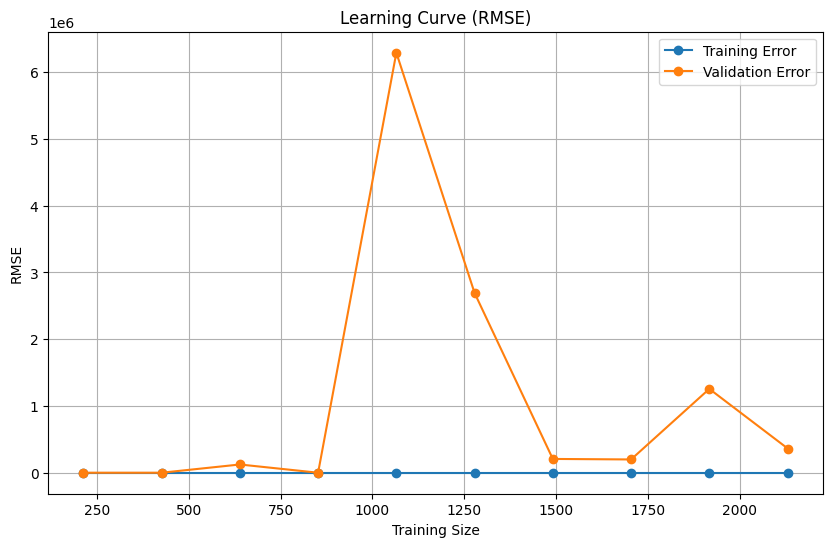

In [86]:
from sklearn.model_selection import learning_curve
train_sizes, train_scores, val_scores = learning_curve(
    model, X, y, cv=5, scoring='neg_mean_squared_error', train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
)

train_scores_mean = np.sqrt(-train_scores.mean(axis=1))
val_scores_mean = np.sqrt(-val_scores.mean(axis=1))

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label="Training Error", marker='o')
plt.plot(train_sizes, val_scores_mean, label="Validation Error", marker='o')
plt.title("Learning Curve (RMSE)")
plt.xlabel("Training Size")
plt.ylabel("RMSE")
plt.legend()
plt.grid()
plt.show()


In [87]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(n_estimators=700, learning_rate=0.05, max_depth=3)
stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('svr', svr_model), ('xgb', xgb_model)],
    final_estimator=LinearRegression()
)
stacking_model.fit(X_train, y_train)
y_pred = stacking_model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 21629.649087173093
RMSE: 28891.533985229893
R²: 0.6408846782619793


In [88]:
import lightgbm as lgb

lgb_model = lgb.LGBMRegressor(n_estimators=700, learning_rate=0.05,max_depth=7, num_leaves=35)
stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('svr', svr_model), ('lgb', lgb_model)],
    final_estimator=LinearRegression()
)
stacking_model.fit(X_train, y_train)
y_pred = stacking_model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003226 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 433
[LightGBM] [Info] Number of data points in the train set: 2131, number of used features: 173
[LightGBM] [Info] Start training from score 78856.888315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

In [89]:
from catboost import CatBoostRegressor

catboost_model = CatBoostRegressor(iterations=1200, learning_rate=0.05, depth=3, silent=True)
stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('svr', svr_model), ('catboost', catboost_model)],
    final_estimator=LinearRegression()
)
stacking_model.fit(X_train, y_train)
y_pred = stacking_model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 21429.383347089253
RMSE: 28557.213713200374
R²: 0.6491476451059779


In [90]:
svr = SVR(kernel = "rbf", C =100000, epsilon = 0.01)
bagging_svr = BaggingRegressor(
    base_estimator=svr,    
    n_estimators=300,       
    max_samples=0.8,       
    max_features=0.8,      
    random_state=42,
    n_jobs=-1              
)

bagging_svr.fit(X_train, y_train)

y_pred = bagging_svr.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


MAE: 25998.211842442175
RMSE: 34362.67588840894
R²: 0.49199652376906755


# XGBoost

In [91]:
from xgboost import XGBRegressor
xgb_best = XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.01,
    max_depth=5,
    n_estimators=700,
    subsample=0.8,
    random_state=42
)
xgb_best.fit(X_train, y_train)

y_pred = xgb_best.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 21142.986063792294
RMSE: 28216.751249082627
R²: 0.6574635822093522


**Random forest + xgb**

In [92]:
xgb = XGBRegressor(
    colsample_bytree=0.5,
    learning_rate=0.01,
    max_depth=5,
    n_estimators=700,
    subsample=0.5,
    random_state=42
)

rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=3,
    random_state=42
)

meta_model = Ridge(alpha=0.1)

stacking_regressor = StackingRegressor(
    estimators=[
        ('xgb', xgb),
        ('rf', rf)
    ],
    final_estimator=meta_model
)

stacking_regressor.fit(X_train, y_train)

y_pred = stacking_regressor.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 20567.30929238837
RMSE: 27642.460937888565
R²: 0.6712648514448758


**Average of xgb and gb**

In [93]:

weight_xgb = 0.8
weight_gb = 0.2

xgb_best.fit(X_train, y_train)
gb_model.fit(X_train, y_train)

y_pred_xgb = xgb_best.predict(X_val)
y_pred_gb = gb_model.predict(X_val)

y_pred_weighted = (weight_xgb * y_pred_xgb + weight_gb * y_pred_gb)

mae_weighted = mean_absolute_error(y_val, y_pred_weighted)
rmse_weighted = mean_squared_error(y_val, y_pred_weighted, squared=False)
r2_weighted = r2_score(y_val, y_pred_weighted)

print("Combined Model (Weighted Averaging):")
print(f"MAE: {mae_weighted}")
print(f"RMSE: {rmse_weighted}")
print(f"R²: {r2_weighted}")


Combined Model (Weighted Averaging):
MAE: 20999.296959875974
RMSE: 28013.634544609296
R²: 0.6623772912564403


# CatBoostRegressor

In [94]:
import catboost as cb
lr_model = LinearRegression()
cb_model = cb.CatBoostRegressor(learning_rate=0.05, iterations=1000, depth=3, silent=True)

stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('catboost', cb_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train, y_train)

y_pred = stacking_model.predict(X_val)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 20845.077561290138
RMSE: 28074.70744001994
R²: 0.6609035751005479


# Kết hợp tất 

In [95]:
xgb = XGBRegressor(
    colsample_bytree = 0.5,
    learning_rate = 0.05,
    max_depth = 3,
    n_estimators = 500,
    subsample = 0.5,
    random_state = 42
)
lr = LinearRegression()
svr = SVR(kernel = "rbf", C =100000, epsilon = 0.01)
dt = DecisionTreeRegressor(max_depth = 3, random_state = 42)
lgb = LGBMRegressor(n_estimators = 500, learning_rate = 0.01, max_depth = 5, random_state= 42)
catboost = CatBoostRegressor(n_estimators=500, learning_rate=0.01, depth=5, random_state=42, verbose=False)
meta_model = Ridge(alpha = 0.1)
stacking_regressor = StackingRegressor(
    estimators=[
        ('xgb', xgb),
        ('lr', lr),
        ('svr', svr),
        ('dt', dt),
        ('lgb', lgb),
        ('catboost', catboost),
    ],
    final_estimator=meta_model
)
stacking_regressor.fit(X_train, y_train)
y_pred = stacking_regressor.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 433
[LightGBM] [Info] Number of data points in the train set: 2131, number of used features: 173
[LightGBM] [Info] Start training from score 78856.888315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=8.38382e-23): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
MAE: 20769.727804623257
RMSE: 27958.01542741819
R²: 0.6637166130423795


# Thêm feature

In [96]:
X_train['YearsCodePro_EdLevelGroup'] = X_train['YearsCodePro'] * X_train['EdLevelGroup']
X_val['YearsCodePro_EdLevelGroup'] = X_val['YearsCodePro'] * X_val['EdLevelGroup']
X_train

,Age,YearsCode,YearsCodePro,EdLevelGroup,APL,APT,ASP_NET,ASP_NET_CORE,ASP_NET_Core_,AWS,...,Country_Venezuela__Bolivarian_Republic_of___,Country_Viet_Nam,Country_Zimbabwe,Data_Professional,DevOps_SRE,Game_Developer,Mobile_Developer,Other,Web_Developer,YearsCodePro_EdLevelGroup
0,30.0,-0.327463,-0.453845,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0,0,0,0,0,1,-0.907691
1,50.0,1.336284,1.402988,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0,0,0,0,0,1,2.805975
2,30.0,-0.327463,-0.586476,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0,0,0,0,1,0,-1.172953
3,30.0,-0.921658,-0.719107,3,0,0,0,0,0,1,...,0.0,0.0,0.0,0,0,0,0,1,0,-2.157322
4,40.0,1.336284,1.402988,2,0,0,0,0,0,1,...,0.0,0.0,0.0,0,1,0,0,0,1,2.805975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2126,40.0,0.742089,-0.188584,2,0,0,0,0,0,1,...,0.0,0.0,0.0,0,0,0,0,0,1,-0.377167
2127,50.0,1.098606,1.270357,3,0,0,0,0,0,0,...,0.0,0.0,0.0,0,1,0,0,0,0,3.811070
2128,30.0,-0.208624,-0.188584,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0,0,0,1,0,0,-0.377167
2129,30.0,-0.327463,-1.117000,2,0,0,0,0,0,0,...,0.0,0.0,0.0,0,0,0,0,0,1,-2.234000


In [97]:
rf_model = RandomForestRegressor(n_estimators=1000, max_depth=15,random_state=42)

rf_model.fit(X_train, y_train)


y_pred = rf_model.predict(X_val)

print("MAE:", mean_absolute_error(y_val, y_pred))
print("RMSE:", mean_squared_error(y_val, y_pred, squared=False))
print("R²:", r2_score(y_val, y_pred))


MAE: 22499.758945465335
RMSE: 29609.155997500016
R²: 0.6228233588723155


In [98]:
import pandas as pd
import numpy as np

correlations = X_train.corrwith(y_train)
correlations = correlations.abs().sort_values(ascending=False)
num_features = int(0.8 * len(correlations)) 
selected_features = correlations.head(num_features).index  
X_train_selected = X_train[selected_features]
X_val_selected = X_val[selected_features]

print(f"Selected features: {selected_features}")


Selected features: Index(['Country_United_States_of_America', 'YearsCodePro', 'YearsCode', 'Age',
       'YearsCodePro_EdLevelGroup', 'Country_India', 'Terraform',
       'Country_Brazil', 'Homebrew', 'Amazon_Web_Services__AWS_',
       ...
       'Country_Romania', 'DevOps_SRE', 'Unity_3D', 'Country_New_Zealand',
       'Prolog', 'PythonAnywhere', 'Java', 'OpenStack', 'SCons',
       'Digital_Ocean'],
      dtype='object', length=265)


/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [99]:
rf_model = RandomForestRegressor(n_estimators=800, max_depth=15,random_state=42)

rf_model.fit(X_train_selected, y_train)


y_pred = rf_model.predict(X_val_selected)

print("MAE:", mean_absolute_error(y_val, y_pred))
print("RMSE:", mean_squared_error(y_val, y_pred, squared=False))
print("R²:", r2_score(y_val, y_pred))


MAE: 22699.941037716446
RMSE: 29729.680920860337
R²: 0.6197464925656657


In [100]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 24640.322838345866
RMSE: 31877.962390659082
R²: 0.5628063551572782


# Lọc feature theo correlation

In [101]:
train_data

,Salary,Age,YearsCode,YearsCodePro,EdLevelGroup,APL,APT,ASP.NET,ASP.NET CORE,ASP.NET Core,...,Country_Uzbekistan,"Country_Venezuela, Bolivarian Republic of...",Country_Viet Nam,Country_Zimbabwe,Data Professional,DevOps/SRE,Game Developer,Mobile Developer,Other,Web Developer
0,97000.0,30.0,-0.327463,-0.453845,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
1,138000.0,50.0,1.336284,1.402988,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2,51057.0,30.0,-0.327463,-0.586476,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
3,77831.0,30.0,-0.921658,-0.719107,3,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,1,0
4,117126.0,40.0,1.336284,1.402988,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2126,150000.0,40.0,0.742089,-0.188584,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1
2127,60216.0,50.0,1.098606,1.270357,3,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,1,0,0,0,0
2128,67452.0,30.0,-0.208624,-0.188584,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,1,0,0
2129,68832.0,30.0,-0.327463,-1.117000,2,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,1


In [102]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train_selected, y_train)
y_pred = model.predict(X_val_selected)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 23986.308232605872
RMSE: 31564.35960342787
R²: 0.5713659205905929


In [103]:
from xgboost import XGBRegressor
xgb_best = XGBRegressor(
    colsample_bytree=0.8,
    learning_rate=0.01,
    max_depth=5,
    n_estimators=700,
    subsample=0.8,
    random_state=42
)
xgb_best.fit(X_train_selected, y_train)

y_pred = xgb_best.predict(X_val_selected)
mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")


MAE: 21279.11251762218
RMSE: 28489.89588064032
R²: 0.6507998218390816


In [104]:
import catboost as cb
lr_model = LinearRegression()
cb_model = cb.CatBoostRegressor(learning_rate=0.05, iterations=1000, depth=3, silent=True)

stacking_model = StackingRegressor(
    estimators=[('lr', lr_model), ('catboost', cb_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train_selected, y_train)

y_pred = stacking_model.predict(X_val_selected)

mae = mean_absolute_error(y_val, y_pred)
rmse = mean_squared_error(y_val, y_pred, squared=False)
r2 = r2_score(y_val, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")

MAE: 21329.5359047046
RMSE: 28635.55049687952
R²: 0.6472201221629257


# Evaluation

(k-fold) Cross-validation